Explore parameter space from optimization results

In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

from IPython.display import display, HTML
from pathlib import Path
from PIL import Image

In [17]:
# path to directory that holds the results of optimize module
# expects CSV files in root directory with optimization results (comparison_results_h3_<H3_RESOLUTION>)
# and two subdirectories (hotspots_h3_<H3_RESOLUTION>, comparisons_h3_<H3_RESOLUTION>) with PNG plots
in_dir = "/mnt/data1/Experiments/focusmap/results/1_explore_gridsearch/floods_pakistan_2022"
metric = "r_square_adj"  # "aic"

In [18]:
# read optimization results and combine them into one dataframe
dfs = [pd.read_csv(df_file, sep=";") for df_file in Path(in_dir).glob("comparison_results_h3_*.csv")]
parameter = pd.concat(dfs, ignore_index=True).drop(columns=["Unnamed: 0"])

Found 6561 parameter combinations across 3 h3_resolutions [6, 7, 8])


,parameter_id,h3_resolution,normalization_quantiles,pooling_weights,layers,r_square_adj,r,p,aic,bic
1385,1385,6,"[0.01, 0.99]","[2.0, 0.0, 2.0]","['buildings_20220910.gpkg', 'flood_20220910.tif', 'twitter_20220910.gpkg']",0.952,0.974,0.0,-183.408,-179.750
1384,1384,6,"[0.01, 0.99]","[2.0, 0.0, 1.75]","['buildings_20220910.gpkg', 'flood_20220910.tif', 'twitter_20220910.gpkg']",0.951,0.973,0.0,-182.475,-178.818
1383,1383,6,"[0.01, 0.99]","[2.0, 0.0, 1.5]","['buildings_20220910.gpkg', 'flood_20220910.tif', 'twitter_20220910.gpkg']",0.950,0.972,0.0,-181.515,-177.857
1382,1382,6,"[0.01, 0.99]","[2.0, 0.0, 1.25]","['buildings_20220910.gpkg', 'flood_20220910.tif', 'twitter_20220910.gpkg']",0.949,0.971,0.0,-180.413,-176.756
1394,1394,6,"[0.01, 0.99]","[2.0, 0.25, 2.0]","['buildings_20220910.gpkg', 'flood_20220910.tif', 'twitter_20220910.gpkg']",0.949,0.971,0.0,-180.346,-176.689


,parameter_id,h3_resolution,normalization_quantiles,pooling_weights,layers,r_square_adj,r,p,aic,bic
3583,1396,7,"[0.01, 0.99]","[2.0, 0.5, 0.25]","['buildings_20220910.gpkg', 'flood_20220910.tif', 'twitter_20220910.gpkg']",0.921,1.025,0.0,-1461.981,-1454.456
3509,1322,7,"[0.01, 0.99]","[1.75, 0.5, 2.0]","['buildings_20220910.gpkg', 'flood_20220910.tif', 'twitter_20220910.gpkg']",0.920,1.022,0.0,-1460.727,-1453.203
3587,1400,7,"[0.01, 0.99]","[2.0, 0.5, 1.25]","['buildings_20220910.gpkg', 'flood_20220910.tif', 'twitter_20220910.gpkg']",0.920,1.025,0.0,-1459.715,-1452.191
3588,1401,7,"[0.01, 0.99]","[2.0, 0.5, 1.5]","['buildings_20220910.gpkg', 'flood_20220910.tif', 'twitter_20220910.gpkg']",0.920,1.025,0.0,-1460.262,-1452.737
3590,1403,7,"[0.01, 0.99]","[2.0, 0.5, 2.0]","['buildings_20220910.gpkg', 'flood_20220910.tif', 'twitter_20220910.gpkg']",0.920,1.025,0.0,-1461.431,-1453.907


,parameter_id,h3_resolution,normalization_quantiles,pooling_weights,layers,r_square_adj,r,p,aic,bic
5615,1241,8,"[0.01, 0.99]","[1.5, 0.5, 2.0]","['buildings_20220910.gpkg', 'flood_20220910.tif', 'twitter_20220910.gpkg']",0.662,0.971,0.0,-9398.464,-9387.035
5614,1240,8,"[0.01, 0.99]","[1.5, 0.5, 1.75]","['buildings_20220910.gpkg', 'flood_20220910.tif', 'twitter_20220910.gpkg']",0.660,0.968,0.0,-9383.040,-9371.611
5696,1322,8,"[0.01, 0.99]","[1.75, 0.5, 2.0]","['buildings_20220910.gpkg', 'flood_20220910.tif', 'twitter_20220910.gpkg']",0.659,0.999,0.0,-9375.689,-9364.260
5695,1321,8,"[0.01, 0.99]","[1.75, 0.5, 1.75]","['buildings_20220910.gpkg', 'flood_20220910.tif', 'twitter_20220910.gpkg']",0.657,0.997,0.0,-9365.445,-9354.016
5613,1239,8,"[0.01, 0.99]","[1.5, 0.5, 1.5]","['buildings_20220910.gpkg', 'flood_20220910.tif', 'twitter_20220910.gpkg']",0.657,0.965,0.0,-9365.612,-9354.183


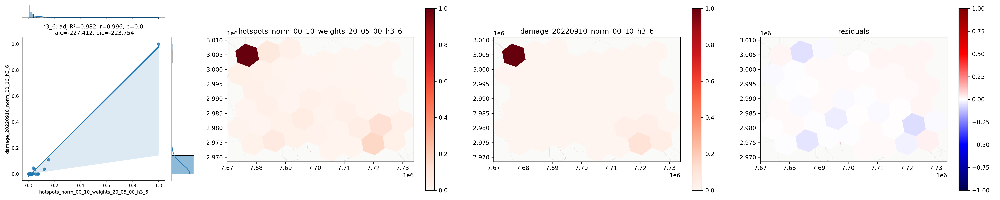

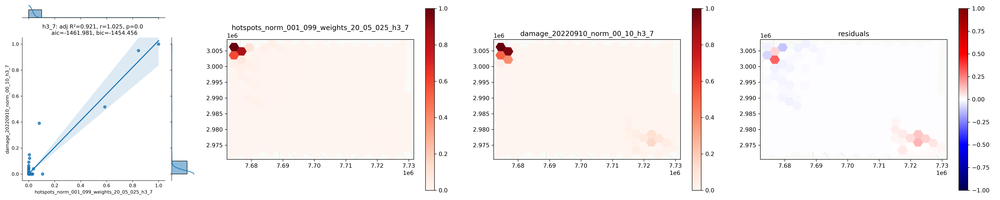

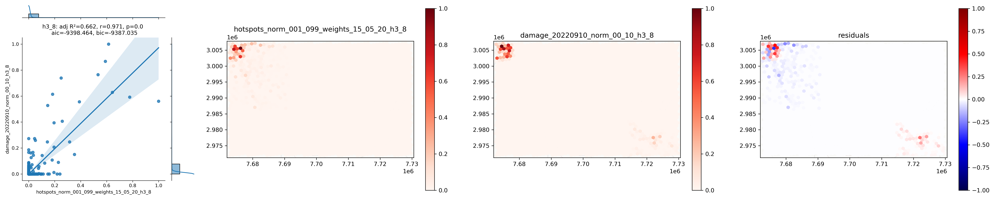

In [19]:
# get unique h3_resolutions in results
h3_resolutions = sorted(parameter["h3_resolution"].unique())
print(
    f"Found {len(parameter)} parameter combinations across {len(h3_resolutions)} h3_resolutions {[h3_res for h3_res in h3_resolutions]})"
)

if metric in ["aic", "bic"]:
    ascending = True
elif metric in ["r_square_adj"]:
    ascending = False
else:
    raise NotImplementedError(f"metric {metric} not supported ['r_square_adj', 'aic', 'bic']")

for h3_resolution in h3_resolutions:
    # report parameters for top 5 highest r_square_adj per h3_resolution
    top5 = parameter[parameter["h3_resolution"] == h3_resolution].sort_values(by=[metric], ascending=ascending)[0:5]
    display(HTML(top5.drop(columns=["file_name"]).to_html()))

for h3_resolution in h3_resolutions:
    # show best parameter comparison plot per h3_resolution (if it exists)
    top1 = parameter[parameter["h3_resolution"] == h3_resolution].sort_values(by=[metric], ascending=ascending)[0:1]
    top1_comparison_img = Path(
        Path(in_dir) / Path(f"comparisons_h3_{h3_resolution}") / Path(f"{top1['file_name'].iloc[0]}.png")
    )
    if top1_comparison_img.exists:
        img = Image.open(top1_comparison_img)
        display(img)

<Axes: xlabel='h3_resolution', ylabel='r_square_adj'>

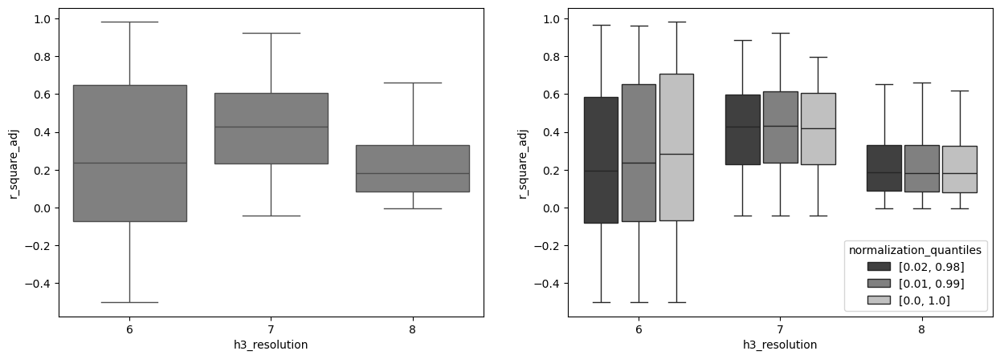

In [21]:
# influence of h3_resolution and normalization quantiles on results
fig, axes = plt.subplots(1, 2, figsize=(15, 5))
sns.boxplot(ax=axes[0], x="h3_resolution", y=metric, data=parameter, color="grey")
sns.boxplot(
    ax=axes[1], x="h3_resolution", y=metric, hue="normalization_quantiles", data=parameter, gap=0.1, palette="grey"
)

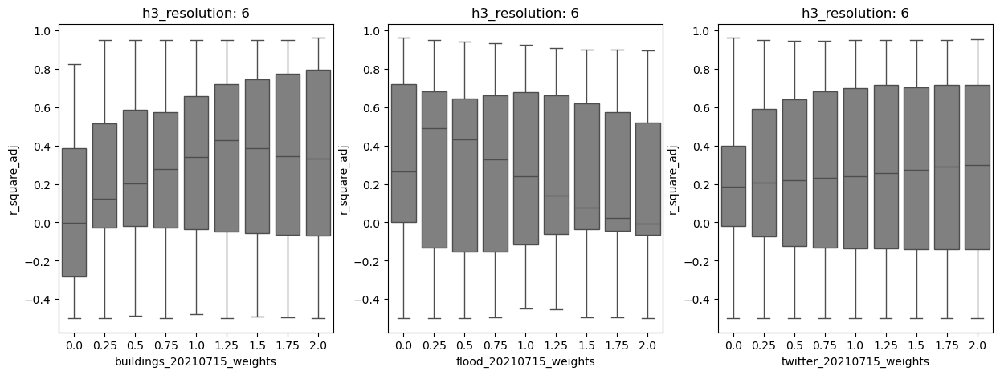

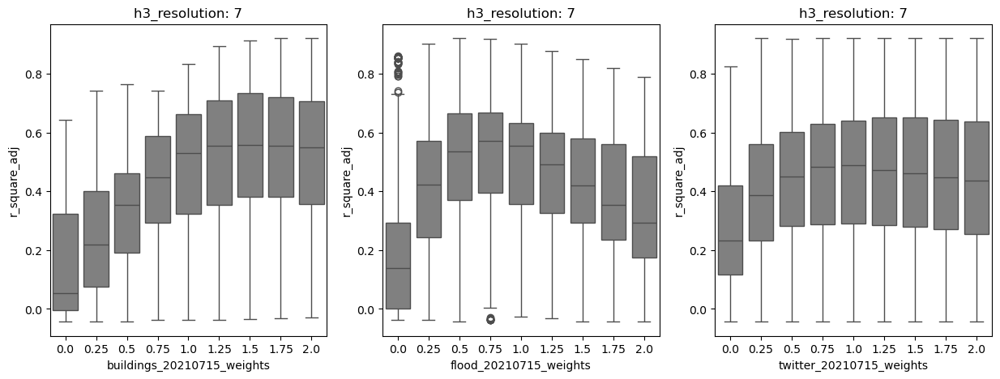

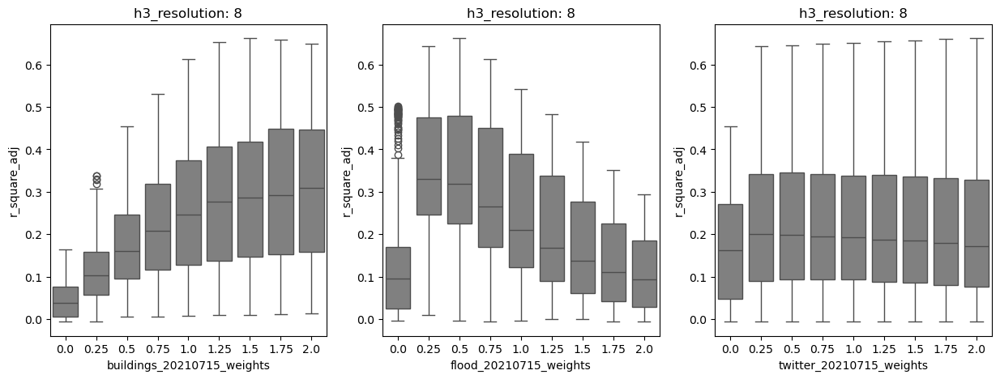

In [26]:
# SETTINGS: put here best normalization quantiles as of before
normalization_quantiles = [0.01, 0.99]

# reshape dataframe layer list to columns with pooling_weights list as values
weight_columns = [
    f"{Path(p).stem}_weights"
    for p in parameter["layers"].iloc[0].strip("[]").replace(" ", "").replace("'", "").split(",")
]

parameter[weight_columns] = pd.DataFrame(
    parameter["pooling_weights"].str.strip("[]").str.split(",", expand=True).values.astype(float),
    index=parameter.index,
)

# influence of pooling weights on results for each h3_resolution
# NOTE: computing the r_square_adj directly across resolutions is misleading
#       because aggregation generally leads to better correlation (higher r_square_adj)
#       therefore we compare results for each h3_resolution separately
for h3_resolution in h3_resolutions:
    # filter parameter by resolution and quantiles
    data = parameter[
        (parameter["h3_resolution"] == h3_resolution)
        & (parameter["normalization_quantiles"] == str(normalization_quantiles))
    ]

    # plot weight distribution per resolution
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    for i, weight_column in enumerate(weight_columns):
        sns.boxplot(ax=axes[i], x=weight_column, y=metric, data=data, color="grey").set(
            title=f"h3_resolution: {h3_resolution}"
        )

In [15]:
# get best overall layer weights across all resolutions
# defined as mode (most frequent value) of the top5 scoring weights for each resolution
top5 = []
for h3_resolution in h3_resolutions:
    # report parameters for top 5 highest r_square_adj per h3_resolution
    top5.append(
        parameter[parameter["h3_resolution"] == h3_resolution].sort_values(by=[metric], ascending=ascending)[0:5]
    )
top5 = pd.concat(top5)
top5_weights = []
for weight_column in weight_columns:
    top5_weights.append(top5[weight_column].mode()[0])
top5_weights = pd.DataFrame(data=[top5_weights], columns=weight_columns)
top5_weights_list = list(top5_weights.to_numpy()[0])
display(HTML(top5_weights.to_html()))
print(f"Best overall layer weights across h3_resolutions: {top5_weights_list}")

,buildings_20210715_weights,flood_20210715_weights,twitter_20210715_weights
0,2.0,0.5,0.0


Best overall layer weights across h3_resolutions: [2.0, 0.5, 0.0]


h3_resolution: 6
Best pooling weights for this resolution: [2.0, 1.0, 1.25] -> r_square_adj = 0.997
Best pooling weights across all resolutions: [2.0, 0.5, 0.75] -> r_square_adj = 0.968


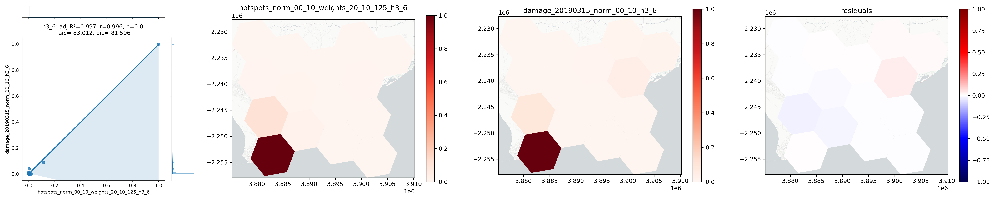

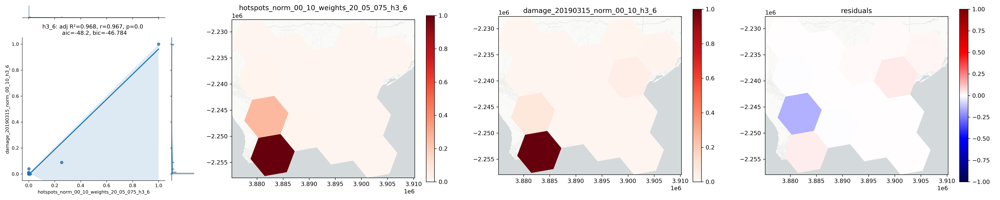

h3_resolution: 7
Best pooling weights for this resolution: [2.0, 2.0, 0.0] -> r_square_adj = 0.93
Best pooling weights across all resolutions: [2.0, 0.5, 0.75] -> r_square_adj = 0.825


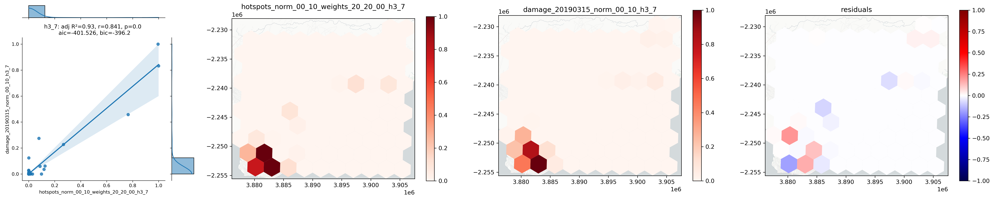

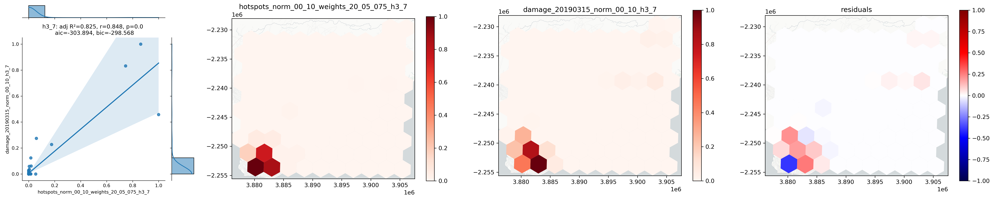

h3_resolution: 8
Best pooling weights for this resolution: [1.0, 0.5, 0.0] -> r_square_adj = 0.797
Best pooling weights across all resolutions: [2.0, 0.5, 0.75] -> r_square_adj = 0.72


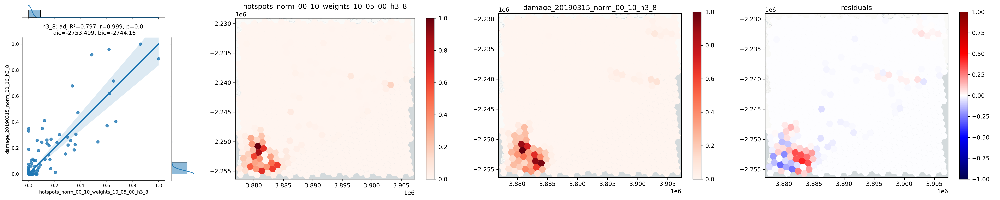

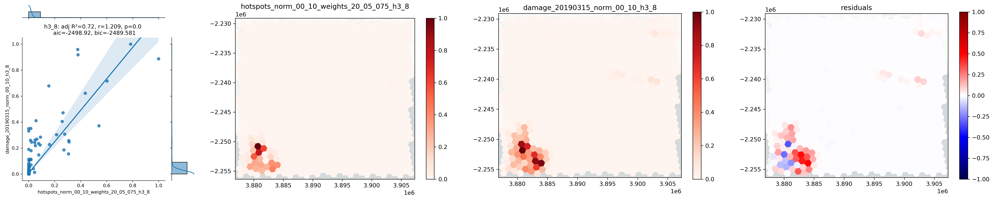

In [12]:
# for each resolution compare its top1 with best overall weights across all resolutions
# deviation from r_squared_adj and from weight value
# plot comparison (top1 vs best overall)
for h3_resolution in h3_resolutions:
    # get best parameter results for this h3_resolution
    top1 = parameter[
        (parameter["h3_resolution"] == h3_resolution)
        & (parameter["normalization_quantiles"] == str(normalization_quantiles))
    ].sort_values(by=[metric], ascending=ascending)[0:1]
    top1_comparison_img = Path(
        Path(in_dir) / Path(f"comparisons_h3_{h3_resolution}") / Path(f"{top1['file_name'].iloc[0]}.png")
    )

    # get parameter results for this h3_resolution that matches best overall pooling weights across h3_resolutions
    top_overall = parameter[
        (parameter["h3_resolution"] == h3_resolution)
        & (parameter["normalization_quantiles"] == str(normalization_quantiles))
        & (parameter["pooling_weights"] == str(top5_weights_list))
    ]
    top_overall_img = Path(
        Path(in_dir) / Path(f"comparisons_h3_{h3_resolution}") / Path(f"{top_overall['file_name'].iloc[0]}.png")
    )

    print(f"h3_resolution: {h3_resolution}")
    print(
        f"Best pooling weights for this resolution: {top1['pooling_weights'].values[0]} -> {metric} = {top1[metric].values[0]}"
    )
    print(
        f"Best pooling weights across all resolutions: {top_overall['pooling_weights'].values[0]} -> {metric} = {top_overall[metric].values[0]}"
    )

    if top1_comparison_img.exists and top_overall_img.exists:
        img1 = Image.open(top1_comparison_img)
        img2 = Image.open(top_overall_img)
        display(img1, img2)